In [1]:
import gc
import requests
import numpy as np
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt
from datetime import datetime


def get_fred_series(series_id, api_key):
    url = f"https://api.stlouisfed.org/fred/series/observations"
    params = {
        "series_id": series_id,
        "api_key": api_key,
        "file_type": "json"
    }
    resp = requests.get(url, params=params)
    data = resp.json()["observations"]
    df = pd.DataFrame(data)
    df["date"] = pd.to_datetime(df["date"])
    df["value"] = pd.to_numeric(df["value"], errors="coerce")
    df.set_index("date", inplace=True)
    return df


def get_fred_series_info(series_id, api_key):
    """시리즈의 최신 데이터 날짜와 메타데이터 확인"""
    url = f"https://api.stlouisfed.org/fred/series/observations"
    params = {
        "series_id": series_id,
        "api_key": api_key,
        "file_type": "json",
        "limit": 1,
        "sort_order": "desc"
    }
    try:
        resp = requests.get(url, params=params)
        data = resp.json()
        if "observations" in data and len(data["observations"]) > 0:
            latest_date = pd.to_datetime(data["observations"][0]["date"])
            return latest_date, True
        else:
            return None, False
    except Exception as e:
        return None, False


FRED_API_KEY = "ea968479ab4b371d4c469cd5537162ab"
START_DATE = "2019-01-01"

gc.collect()


20

# INTEREST RATE

## Yield Curve Spread

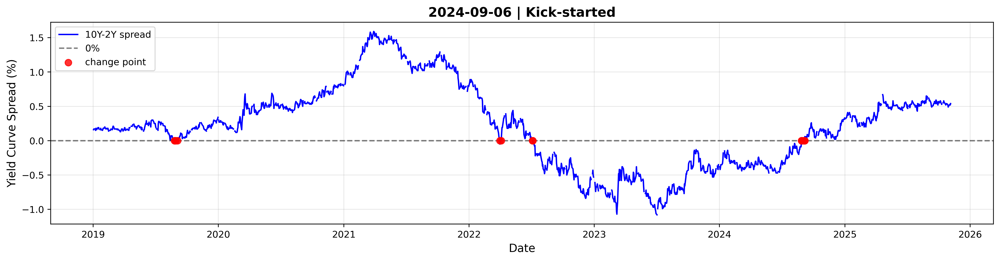

4156

In [2]:
df_10y = get_fred_series("DGS10", FRED_API_KEY)
df_2y = get_fred_series("DGS2", FRED_API_KEY)
df_spread = df_10y.join(df_2y, lsuffix="_10y", rsuffix="_2y")
df_spread["spread_10y_2y"] = df_spread["value_10y"] - df_spread["value_2y"]
sign_df = pd.DataFrame(
    np.sign(df_spread['spread_10y_2y'][START_DATE:].dropna()).diff()).dropna()

plt.figure(figsize=(15, 4), dpi=400)
plt.plot(df_spread[START_DATE:]["spread_10y_2y"],
         label='10Y-2Y spread', linewidth=1.5, color='blue')
plt.axhline(y=0, color='black', linestyle='--', alpha=0.5, label='0%')
change_points = sign_df[sign_df['spread_10y_2y'] != 0]
if not change_points.empty:
    plt.scatter(change_points.index, [
                0] * len(change_points), color='red', s=50, alpha=0.8, zorder=5, label='change point')
if change_points.iloc[-1, -1] > 0:
    plt.title(
        f'{change_points.index[-1].strftime("%Y-%m-%d")} | Kick-started', fontsize=14, fontweight='bold')
else:
    plt.title(
        f'{change_points.index[-1].strftime("%Y-%m-%d")} | Warning', fontsize=14, fontweight='bold')
plt.xlabel('Date', fontsize=12)
plt.ylabel('Yield Curve Spread (%)', fontsize=12)
plt.legend(loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

gc.collect()


## Repo Rate vs Reserve Interest Rate Spread


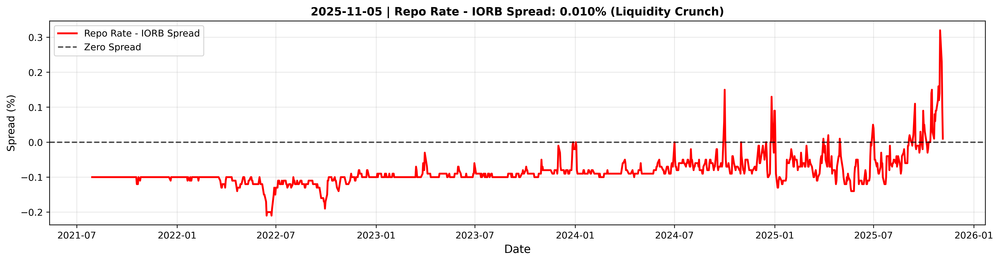

4112

In [3]:
# Repo Rate (Federal Funds Rate) vs Reserve Interest Rate (IORB - Interest on Reserve Balances)
df_repo_rate = get_fred_series("SOFR", FRED_API_KEY)  # Federal Funds Rate (Repo Rate)
df_iorb = get_fred_series("IORB", FRED_API_KEY)  # Interest on Reserve Balances

# Calculate the spread (difference)
df_spread = df_repo_rate.join(df_iorb, lsuffix="_repo", rsuffix="_iorb")
df_spread["spread"] = df_spread["value_repo"].ffill() - df_spread["value_iorb"].ffill()

plt.figure(figsize=(15, 4), dpi=400)

# Plot 3: Spread (Difference)
plt.plot(df_spread[START_DATE:].index, df_spread[START_DATE:]["spread"],
         label='Repo Rate - IORB Spread', linewidth=2, color='red')
plt.axhline(y=0, color='black', linestyle='--', alpha=0.7, label='Zero Spread')
if df_spread.iloc[-1, 0] > df_spread.iloc[-2, 0]:
    plt.title(f'{df_spread.index[-1].strftime("%Y-%m-%d")} | Repo Rate - IORB Spread: {df_spread.iloc[-1]["spread"]:.3f}%(Normal)', 
               fontweight='bold', fontsize=12)
else:
    plt.title(f'{df_spread.index[-1].strftime("%Y-%m-%d")} | Repo Rate - IORB Spread: {df_spread.iloc[-1]["spread"]:.3f}% (Liquidity Crunch)', 
               fontweight='bold', fontsize=12)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Spread (%)', fontsize=11)
plt.legend(loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

gc.collect()


## Current Interest Rate

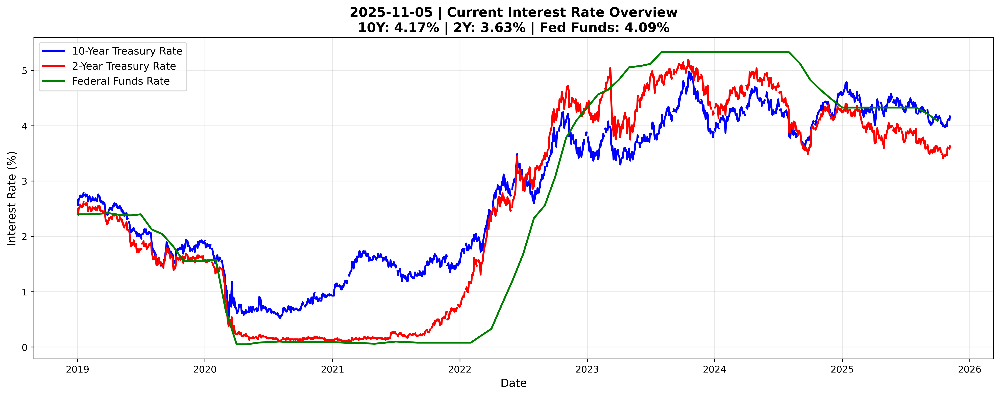

4180

In [4]:
df_fed_funds = get_fred_series("FEDFUNDS", FRED_API_KEY)

plt.figure(figsize=(15, 6), dpi=400)
plt.plot(df_10y[START_DATE:].index, df_10y[START_DATE:]["value"], 
         label='10-Year Treasury Rate', linewidth=2, color='blue')
plt.plot(df_2y[START_DATE:].index, df_2y[START_DATE:]["value"], 
         label='2-Year Treasury Rate', linewidth=2, color='red')
plt.plot(df_fed_funds[START_DATE:].index, df_fed_funds[START_DATE:]["value"], 
         label='Federal Funds Rate', linewidth=2, color='green')
latest_date = df_10y.index[-1]
plt.title(f'{latest_date.strftime("%Y-%m-%d")} | Current Interest Rate Overview\n'
          f'10Y: {df_10y.iloc[-1]["value"]:.2f}% | '
          f'2Y: {df_2y.iloc[-1]["value"]:.2f}% | '
          f'Fed Funds: {df_fed_funds.iloc[-1]["value"]:.2f}%', 
          fontsize=14, fontweight='bold')
plt.xlabel('Date', fontsize=12)
plt.ylabel('Interest Rate (%)', fontsize=12)
plt.legend(loc='upper left', fontsize=11)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

gc.collect()

## SOFR - Federal Funds Rate Spread

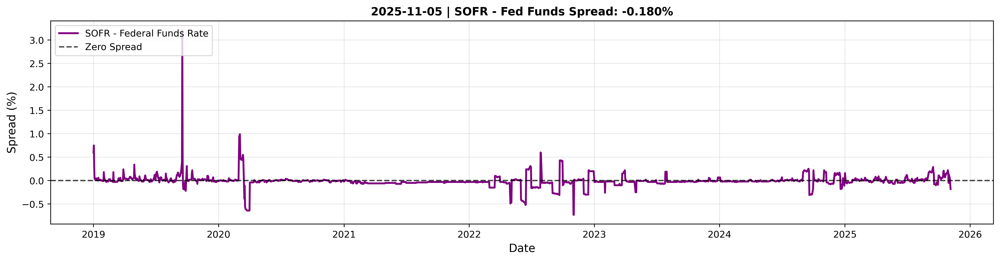

4220

In [5]:
# SOFR과 연준 금리(Federal Funds Rate) 차이
df_sofr = get_fred_series("SOFR", FRED_API_KEY)['value']
df_fed_funds = get_fred_series("FEDFUNDS", FRED_API_KEY)['value'].ffill()

# 두 데이터를 합치고 차이 계산
df_sofr.name = 'value_sofr'
df_fed_funds.name = 'value_fed'
df_sofr_fed_spread = pd.concat([df_sofr, df_fed_funds], axis=1).ffill()

df_sofr_fed_spread["spread"] = df_sofr_fed_spread["value_sofr"].ffill() - df_sofr_fed_spread["value_fed"].ffill()

plt.figure(figsize=(15, 4), dpi=400)
plt.plot(df_sofr_fed_spread[START_DATE:].index, df_sofr_fed_spread[START_DATE:]["spread"],
         label='SOFR - Federal Funds Rate', linewidth=2, color='purple')
plt.axhline(y=0, color='black', linestyle='--', alpha=0.7, label='Zero Spread')
plt.title(f'{df_sofr_fed_spread.index[-1].strftime("%Y-%m-%d")} | SOFR - Fed Funds Spread: {df_sofr_fed_spread.iloc[-1]["spread"]:.3f}%', 
          fontweight='bold', fontsize=12)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Spread (%)', fontsize=12)
plt.legend(loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

gc.collect()


## Inflation Expectations (Nominal - TIPS)


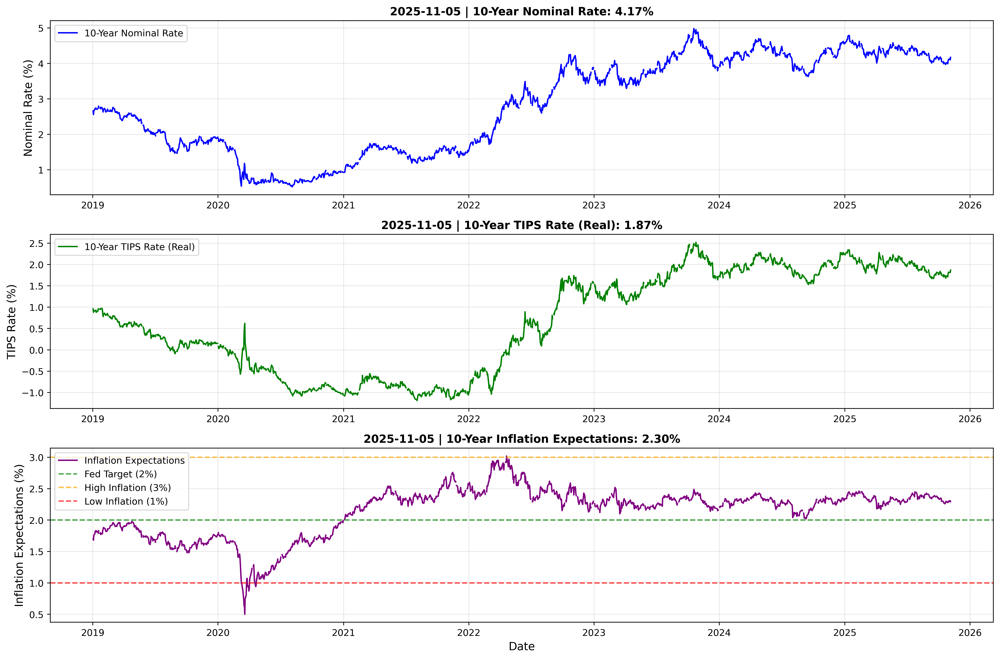

75

In [6]:
df_nominal_10y = get_fred_series("DGS10", FRED_API_KEY)
df_tips_10y = get_fred_series("DFII10", FRED_API_KEY)
df_inflation_expectations = df_nominal_10y.join(
    df_tips_10y, lsuffix="_nominal", rsuffix="_tips")
df_inflation_expectations["inflation_expectations"] = df_inflation_expectations["value_nominal"] - \
    df_inflation_expectations["value_tips"]
current_inflation_exp = df_inflation_expectations.iloc[-1]["inflation_expectations"]


fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(15, 10), dpi=400)
ax1.plot(df_nominal_10y[START_DATE:].index, df_nominal_10y[START_DATE:]["value"],
         label='10-Year Nominal Rate', linewidth=1.5, color='blue')
ax1.set_title(
    f'{df_nominal_10y.index[-1].strftime("%Y-%m-%d")} | 10-Year Nominal Rate: {df_nominal_10y.iloc[-1]["value"]:.2f}%', fontweight='bold')
ax1.set_ylabel('Nominal Rate (%)', fontsize=12)
ax1.legend(loc='upper left')
ax1.grid(True, alpha=0.3)
ax2.plot(df_tips_10y[START_DATE:].index, df_tips_10y[START_DATE:]["value"],
         label='10-Year TIPS Rate (Real)', linewidth=1.5, color='green')
ax2.set_title(
    f'{df_tips_10y.index[-1].strftime("%Y-%m-%d")} | 10-Year TIPS Rate (Real): {df_tips_10y.iloc[-1]["value"]:.2f}%', fontweight='bold')
ax2.set_ylabel('TIPS Rate (%)', fontsize=12)
ax2.legend(loc='upper left')
ax2.grid(True, alpha=0.3)
ax3.plot(df_inflation_expectations[START_DATE:].index, df_inflation_expectations[START_DATE:]["inflation_expectations"],
         label='Inflation Expectations', linewidth=1.5, color='purple')
ax3.axhline(y=2.0, color='green', linestyle='--',
            alpha=0.7, label='Fed Target (2%)')
ax3.axhline(y=3.0, color='orange', linestyle='--',
            alpha=0.7, label='High Inflation (3%)')
ax3.axhline(y=1.0, color='red', linestyle='--',
            alpha=0.7, label='Low Inflation (1%)')
ax3.set_title(
    f'{df_inflation_expectations.index[-1].strftime("%Y-%m-%d")} | 10-Year Inflation Expectations: {current_inflation_exp:.2f}%', fontweight='bold')
ax3.set_xlabel('Date', fontsize=12)
ax3.set_ylabel('Inflation Expectations (%)', fontsize=12)
ax3.legend(loc='upper left')
ax3.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

gc.collect()


## Global Interest Rates Comparison

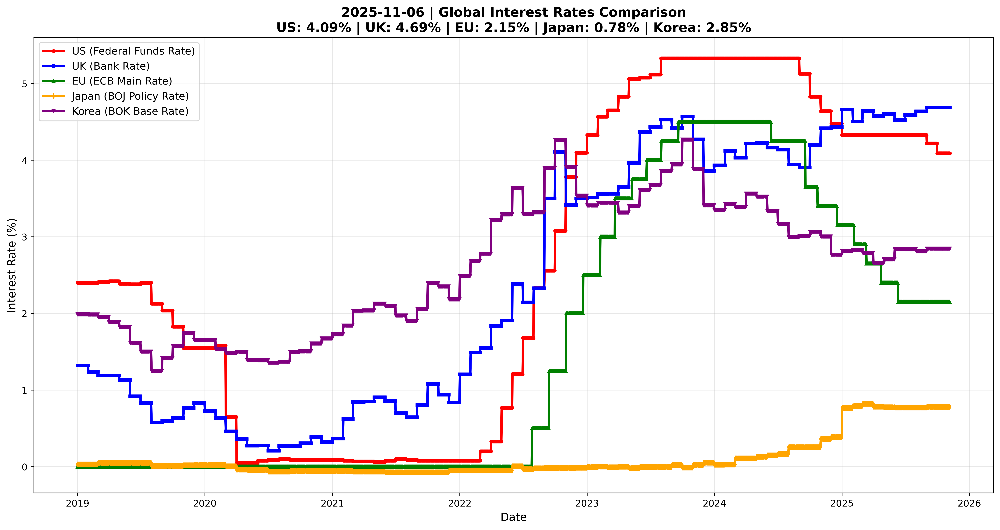

4541

In [7]:
df_us_rate = get_fred_series("FEDFUNDS", FRED_API_KEY)
df_uk_rate = get_fred_series("IRLTLT01GBM156N", FRED_API_KEY)
df_eu_rate = get_fred_series("ECBMRRFR", FRED_API_KEY)
df_jp_rate = get_fred_series("IR3TIB01JPM156N", FRED_API_KEY)
df_kr_rate = get_fred_series("IRLTLT01KRM156N", FRED_API_KEY)
df_global_rates = pd.DataFrame({
    'US': df_us_rate['value'],
    'UK': df_uk_rate['value'],
    'EU': df_eu_rate['value'],
    'JP': df_jp_rate['value'],
    'KR': df_kr_rate['value']
})
df_global_rates = df_global_rates.ffill()

plt.figure(figsize=(15, 8), dpi=400)
plt.plot(df_global_rates[START_DATE:].index, df_global_rates[START_DATE:]['US'],
         label='US (Federal Funds Rate)', linewidth=2.5, color='red', marker='o', markersize=3)
plt.plot(df_global_rates[START_DATE:].index, df_global_rates[START_DATE:]['UK'],
         label='UK (Bank Rate)', linewidth=2.5, color='blue', marker='s', markersize=3)
plt.plot(df_global_rates[START_DATE:].index, df_global_rates[START_DATE:]['EU'],
         label='EU (ECB Main Rate)', linewidth=2.5, color='green', marker='^', markersize=3)
plt.plot(df_global_rates[START_DATE:].index, df_global_rates[START_DATE:]['JP'],
         label='Japan (BOJ Policy Rate)', linewidth=2.5, color='orange', marker='d', markersize=3)
plt.plot(df_global_rates[START_DATE:].index, df_global_rates[START_DATE:]['KR'],
         label='Korea (BOK Base Rate)', linewidth=2.5, color='purple', marker='v', markersize=3)
latest_date = df_global_rates.index[-1]
us_latest = df_global_rates.iloc[-1]['US']
uk_latest = df_global_rates.iloc[-1]['UK']
eu_latest = df_global_rates.iloc[-1]['EU']
jp_latest = df_global_rates.iloc[-1]['JP']
kr_latest = df_global_rates.iloc[-1]['KR']
plt.title(f'{latest_date.strftime("%Y-%m-%d")} | Global Interest Rates Comparison\n'
          f'US: {us_latest:.2f}% | UK: {uk_latest:.2f}% | EU: {eu_latest:.2f}% | Japan: {jp_latest:.2f}% | Korea: {kr_latest:.2f}%',
          fontsize=14, fontweight='bold')
plt.xlabel('Date', fontsize=12)
plt.ylabel('Interest Rate (%)', fontsize=12)
plt.legend(loc='upper left', fontsize=11)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

gc.collect()


## Buffett Indicator Inverse - 10Y Treasury Rate


[*********************100%***********************]  1 of 1 completed


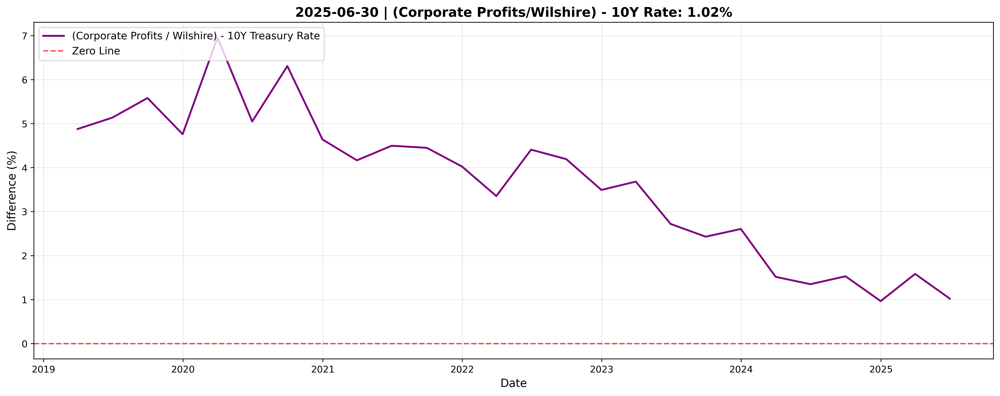

4117

In [8]:
# Wilshire 5000 데이터 가져오기 (총시가총액으로 간주)
wilshire_ticker = "^W5000"
wilshire_data = yf.download(wilshire_ticker, start="1970-01-01", auto_adjust=False)

# yfinance 최신 버전에서는 데이터 구조가 다를 수 있음
if 'Close' in wilshire_data.columns:
    if isinstance(wilshire_data.columns, pd.MultiIndex):
        wilshire_close = wilshire_data['Close'][wilshire_ticker].copy()
    else:
        wilshire_close = wilshire_data['Close'].copy()
else:
    # Adj Close가 있는 경우
    if isinstance(wilshire_data.columns, pd.MultiIndex):
        wilshire_close = wilshire_data['Adj Close'][wilshire_ticker].copy()
    else:
        wilshire_close = wilshire_data['Adj Close'].copy()

wilshire_df = pd.DataFrame({'wilshire': wilshire_close})
wilshire_df.index = pd.to_datetime(wilshire_df.index)
wilshire_df = wilshire_df.resample('QE').last()  # 분기별로 리샘플링

# FRED에서 기업총이익 가져오기
df_corp_profits = get_fred_series("CPATAX", FRED_API_KEY)  # Corporate Profits After Tax

# 분기별로 리샘플링
df_corp_profits_q = df_corp_profits.resample('QE').last()

# 인덱스 정렬
common_index = wilshire_df.index.intersection(df_corp_profits_q.index)

wilshire_aligned = wilshire_df.loc[common_index]
corp_profits_aligned = df_corp_profits_q.loc[common_index]

# 10년물 국채 금리 가져오기
df_10y = get_fred_series("DGS10", FRED_API_KEY)
df_10y_q = df_10y.resample('QE').last()  # 분기별로 리샘플링

# 버핏지수의 역수 계산 (Corporate Profits/Wilshire)
buffett_inv_corp_profits = (corp_profits_aligned['value'] / wilshire_aligned['wilshire']) * 100

# 10년물 국채 금리와 인덱스 정렬
common_index_10y = buffett_inv_corp_profits.index.intersection(df_10y_q.index)
buffett_inv_corp_profits_aligned = buffett_inv_corp_profits.loc[common_index_10y]
df_10y_aligned = df_10y_q.loc[common_index_10y]

# 역수에서 10년물 국채 금리를 뺀 값 계산
buffett_inv_minus_10y_corp_profits = buffett_inv_corp_profits_aligned - df_10y_aligned['value']

# 그래프 그리기
plt.figure(figsize=(15, 6), dpi=400)
plt.plot(buffett_inv_minus_10y_corp_profits[START_DATE:].index, buffett_inv_minus_10y_corp_profits[START_DATE:], 
         label='(Corporate Profits / Wilshire) - 10Y Treasury Rate', linewidth=2, color='purple')
plt.axhline(y=0, color='red', linestyle='--', alpha=0.7, label='Zero Line')
plt.title(f'{buffett_inv_minus_10y_corp_profits.index[-1].strftime("%Y-%m-%d")} | (Corporate Profits/Wilshire) - 10Y Rate: {buffett_inv_minus_10y_corp_profits.iloc[-1]:.2f}%', 
          fontweight='bold', fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Difference (%)', fontsize=12)
plt.legend(loc='upper left', fontsize=11)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

gc.collect()


## High Yield Bond Spread (High Yield - Treasury)


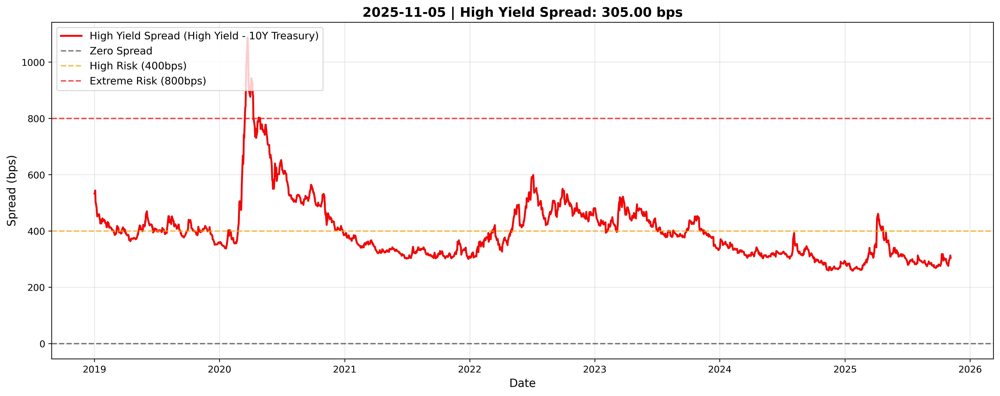

4413

In [9]:
# FRED에서 하이일드 채권 금리와 국채 금리 가져오기
# BAMLH0A0HYM2: Merrill Lynch US High Yield Master II Effective Yield
df_high_yield = get_fred_series("BAMLH0A0HYM2", FRED_API_KEY)

# 인덱스 정렬

df_high_yield_aligned = df_high_yield.ffill()


# 하이일드 채권 금리에서 국채 금리를 뺀 스프레드 계산
high_yield_spread = (df_high_yield_aligned['value']) * 100

# 그래프 그리기
plt.figure(figsize=(15, 6), dpi=400)
plt.plot(high_yield_spread[START_DATE:].index, high_yield_spread[START_DATE:],
         label='High Yield Spread (High Yield - 10Y Treasury)', linewidth=2, color='red')
plt.axhline(y=0, color='black', linestyle='--', alpha=0.5, label='Zero Spread')
plt.axhline(y=400, color='orange', linestyle='--', alpha=0.7, label='High Risk (400bps)')
plt.axhline(y=800, color='red', linestyle='--', alpha=0.7, label='Extreme Risk (800bps)')
plt.title(f'{high_yield_spread.index[-1].strftime("%Y-%m-%d")} | High Yield Spread: {high_yield_spread.iloc[-1]:.2f} bps', 
          fontweight='bold', fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Spread (bps)', fontsize=12)
plt.legend(loc='upper left', fontsize=11)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

gc.collect()


# INDEX

## Dollar Index

[*********************100%***********************]  1 of 1 completed


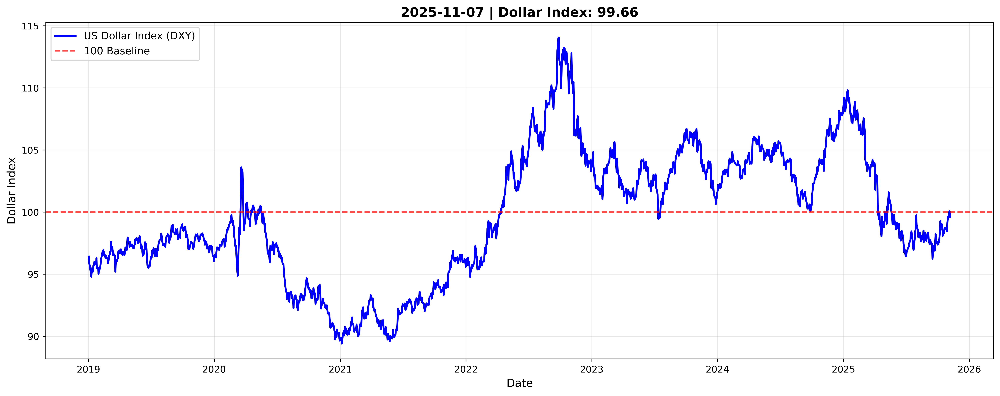

4023

In [10]:
# yfinance에서 달러 인덱스 가져오기 (DX=F: US Dollar Index Futures)
dollar_data = yf.download("DX=F", start="1970-01-01", auto_adjust=False)

# yfinance 최신 버전에서는 데이터 구조가 다를 수 있음
if 'Close' in dollar_data.columns:
    if isinstance(dollar_data.columns, pd.MultiIndex):
        dollar_close = dollar_data['Close']['DX=F'].copy()
    else:
        dollar_close = dollar_data['Close'].copy()
else:
    # Adj Close가 있는 경우
    if isinstance(dollar_data.columns, pd.MultiIndex):
        dollar_close = dollar_data['Adj Close']['DX=F'].copy()
    else:
        dollar_close = dollar_data['Adj Close'].copy()

df_dollar_index = pd.DataFrame({'dollar_index': dollar_close})
df_dollar_index.index = pd.to_datetime(df_dollar_index.index)

plt.figure(figsize=(15, 6), dpi=400)
plt.plot(df_dollar_index[START_DATE:].index, df_dollar_index[START_DATE:]['dollar_index'],
         label='US Dollar Index (DXY)', linewidth=2, color='blue')
plt.axhline(y=100, color='red', linestyle='--', alpha=0.7, label='100 Baseline')
plt.title(f'{df_dollar_index.index[-1].strftime("%Y-%m-%d")} | Dollar Index: {df_dollar_index.iloc[-1]["dollar_index"]:.2f}', 
          fontweight='bold', fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Dollar Index', fontsize=12)
plt.legend(loc='upper left', fontsize=11)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

gc.collect()


## S&P500 30-Day Moving Average

[*********************100%***********************]  2 of 2 completed


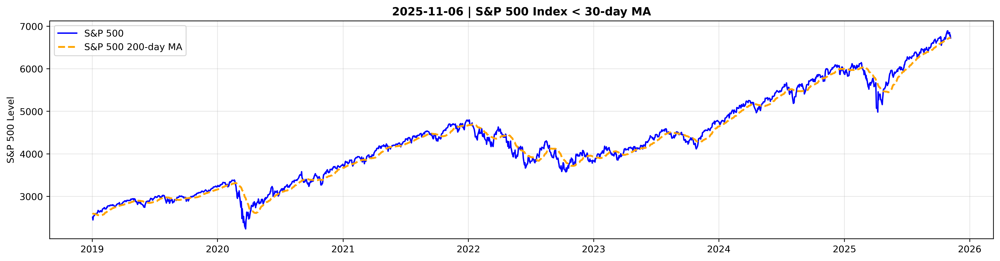

3921

In [11]:
tickers = ["GC=F", "^GSPC"]
data = yf.download(tickers, start='2000-01-01', auto_adjust=False)
df_sp500 = pd.DataFrame(data['Adj Close']['^GSPC'].copy())
df_sp500["sp500_ma200"] = df_sp500.dropna().rolling(window=30).mean()
df_sp500 = df_sp500.dropna()

plt.figure(figsize=(15, 4), dpi=400)
plt.plot(df_sp500[START_DATE:].index, df_sp500[START_DATE:]["^GSPC"],
         label='S&P 500', linewidth=1.5, color='blue')
plt.plot(df_sp500[START_DATE:].index, df_sp500[START_DATE:]["sp500_ma200"],
         label='S&P 500 200-day MA', linewidth=2, color='orange', linestyle='--')
if df_sp500.iloc[-1, 0] > df_sp500.iloc[-1, 1]:
    plt.title(
        f'{df_sp500.index[-1].strftime("%Y-%m-%d")} | S&P 500 Index > 30-day MA', fontweight='bold')
else:
    plt.title(
        f'{df_sp500.index[-1].strftime("%Y-%m-%d")} | S&P 500 Index < 30-day MA', fontweight='bold')
plt.ylabel('S&P 500 Level')
plt.legend(loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

gc.collect()


## S&P500 and Facility Investment

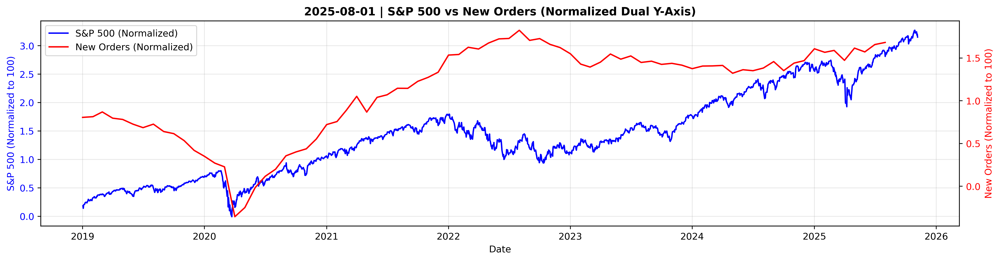

20

In [12]:
df_neworder = get_fred_series("NEWORDER", FRED_API_KEY)
sp500_norm = (df_sp500["^GSPC"] - df_sp500["^GSPC"].mean()
              ) / df_sp500["^GSPC"].std()
neworder_norm = (
    df_neworder['value'] - df_neworder['value'].mean()) / df_neworder['value'].std()
sp500_norm = sp500_norm.loc[START_DATE:]
neworder_norm = neworder_norm.loc[START_DATE:]

fig, ax1 = plt.subplots(figsize=(15, 4), dpi=400)
color1 = 'blue'
ax1.set_xlabel('Date')
ax1.set_ylabel('S&P 500 (Normalized to 100)', color=color1)
line1 = ax1.plot(sp500_norm.index, sp500_norm,
                 color=color1, linewidth=1.5, label='S&P 500 (Normalized)')
ax1.tick_params(axis='y', labelcolor=color1)
ax1.grid(True, alpha=0.3)
ax2 = ax1.twinx()
color2 = 'red'
ax2.set_ylabel('New Orders (Normalized to 100)', color=color2)
line2 = ax2.plot(neworder_norm.index, neworder_norm,
                 color=color2, linewidth=1.5, label='New Orders (Normalized)')
ax2.tick_params(axis='y', labelcolor=color2)
lines = line1 + line2
labels = [l.get_label() for l in lines]
ax1.legend(lines, labels, loc='upper left')
plt.title(
    f'{neworder_norm.index[-1].strftime("%Y-%m-%d")} | S&P 500 vs New Orders (Normalized Dual Y-Axis)', fontweight='bold')
plt.tight_layout()
plt.show()

gc.collect()


## Gold Volatility

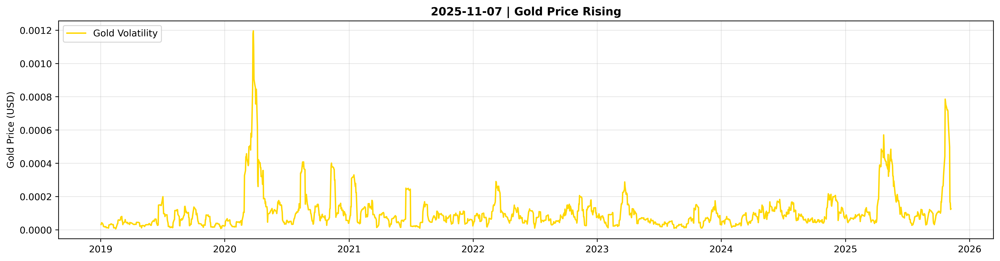

3931

In [13]:
df_gold = pd.DataFrame(data['Adj Close']['GC=F'].copy())
gold_vol = df_gold.pct_change(fill_method=None).apply(
    lambda x: np.log1p(x)**2).rolling(window=10).mean()

plt.figure(figsize=(15, 4), dpi=400)
plt.plot(gold_vol[START_DATE:].index, gold_vol[START_DATE:],
         label='Gold Volatility', linewidth=1.5, color='gold')
if df_gold.iloc[-1, 0] > df_gold.iloc[-2, 0]:
    plt.title(
        f'{df_gold.index[-1].strftime("%Y-%m-%d")} | Gold Price Rising', fontweight='bold')
else:
    plt.title(
        f'{df_gold.index[-1].strftime("%Y-%m-%d")} | Gold Price Falling', fontweight='bold')
plt.ylabel('Gold Price (USD)')
plt.legend(loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

gc.collect()


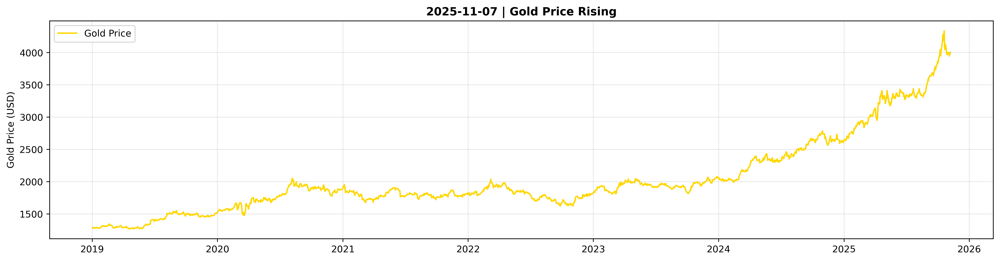

3837

In [14]:
df_gold = pd.DataFrame(data['Adj Close']['GC=F'].copy())
gold_vol = df_gold.pct_change(fill_method=None).apply(
    lambda x: np.log1p(x)**2).rolling(window=10).mean()

plt.figure(figsize=(15, 4), dpi=400)
plt.plot(df_gold[START_DATE:].index, df_gold[START_DATE:],
         label='Gold Price', linewidth=1.5, color='gold')
if df_gold.iloc[-1, 0] > df_gold.iloc[-2, 0]:
    plt.title(
        f'{df_gold.index[-1].strftime("%Y-%m-%d")} | Gold Price Rising', fontweight='bold')
else:
    plt.title(
        f'{df_gold.index[-1].strftime("%Y-%m-%d")} | Gold Price Falling', fontweight='bold')
plt.ylabel('Gold Price (USD)')
plt.legend(loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

gc.collect()


## VIX Index

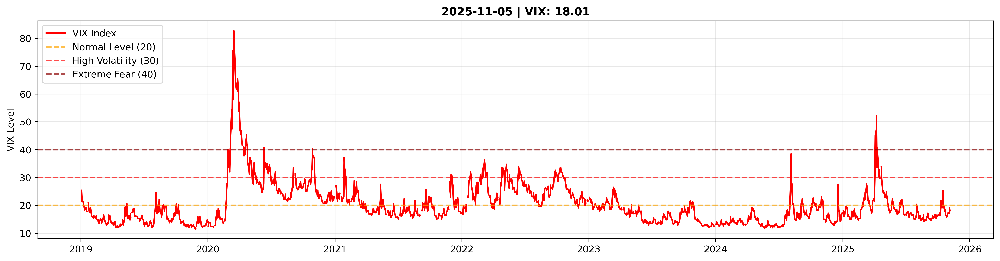

4578

In [15]:
df_vix = get_fred_series("VIXCLS", FRED_API_KEY)

plt.figure(figsize=(15, 4), dpi=400)
plt.plot(df_vix[START_DATE:].index, df_vix[START_DATE:]["value"],
         label='VIX Index', linewidth=1.5, color='red')
plt.axhline(y=20, color='orange', linestyle='--',
            alpha=0.7, label='Normal Level (20)')
plt.axhline(y=30, color='red', linestyle='--',
            alpha=0.7, label='High Volatility (30)')
plt.axhline(y=40, color='darkred', linestyle='--',
            alpha=0.7, label='Extreme Fear (40)')
plt.title(
    f'{df_vix.index[-1].strftime("%Y-%m-%d")} | VIX: {df_vix.iloc[-1]["value"]}', fontweight='bold')
plt.ylabel('VIX Level')
plt.legend(loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

gc.collect()


## Stress Index

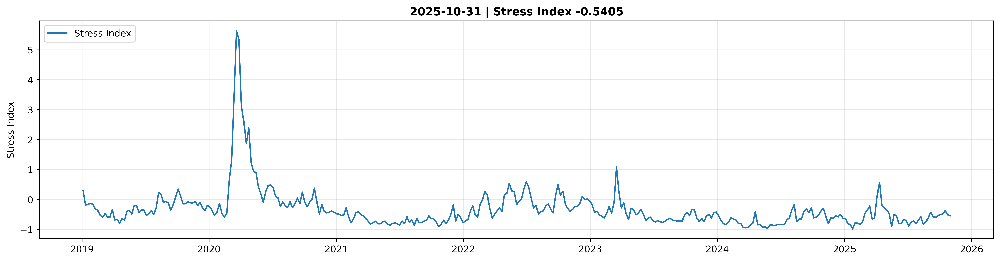

3945

In [16]:
df_stress = get_fred_series("STLFSI4", FRED_API_KEY)

plt.figure(figsize=(15, 4), dpi=400)
plt.plot(df_stress[START_DATE:].index, df_stress[START_DATE:]['value'],
         label='Stress Index', linewidth=1.5)
if df_stress.iloc[-1, 0] > df_stress.iloc[-2, 0]:
    plt.title(
        f'{df_stress.index[-1].strftime("%Y-%m-%d")} | Stress Index {df_stress.iloc[-1]["value"]}', fontweight='bold')
else:
    plt.title(
        f'{df_stress.index[-1].strftime("%Y-%m-%d")} | Stress Index {df_stress.iloc[-1]["value"]}', fontweight='bold')
plt.ylabel('Stress Index')
plt.legend(loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

gc.collect()

# EMPLOYMENT INDICATORS

## Unemployment Insurance Claims

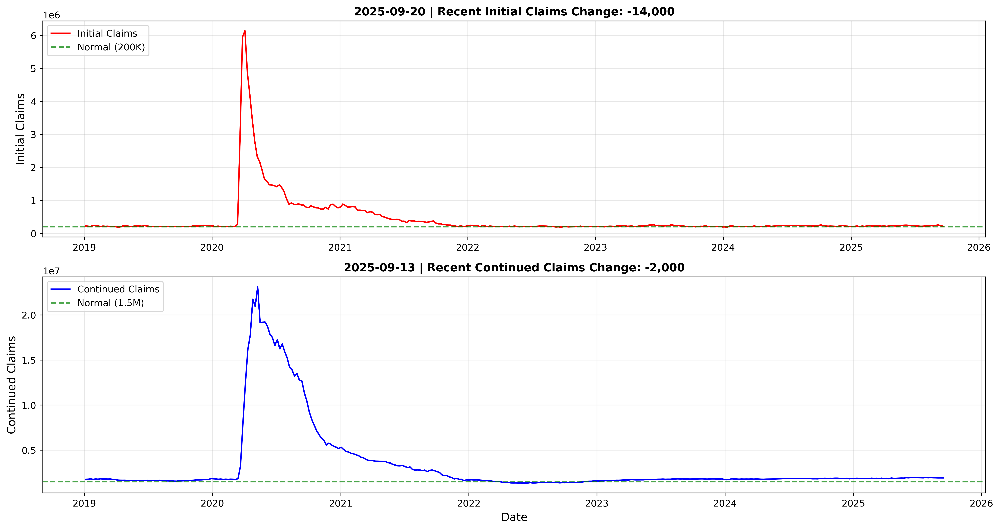

0

In [17]:
df_initial_claims = get_fred_series("ICSA", FRED_API_KEY)
current_initial = df_initial_claims["value"].diff().iloc[-1]
df_continued_claims = get_fred_series("CCSA", FRED_API_KEY)
current_continued = df_continued_claims["value"].diff().iloc[-1]

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 8), dpi=400)
ax1.plot(df_initial_claims[START_DATE:].index, df_initial_claims[START_DATE:]["value"],
         label='Initial Claims', linewidth=1.5, color='red')
ax1.axhline(y=200000, color='green', linestyle='--',
            alpha=0.7, label='Normal (200K)')
ax1.set_title(
    f'{df_initial_claims.index[-1].strftime("%Y-%m-%d")} | Recent Initial Claims Change: {current_initial:,.0f}', fontweight='bold')
ax1.set_ylabel('Initial Claims', fontsize=12)
ax1.legend(loc='upper left')
ax1.grid(True, alpha=0.3)
ax2.plot(df_continued_claims[START_DATE:].index, df_continued_claims[START_DATE:]["value"],
         label='Continued Claims', linewidth=1.5, color='blue')
ax2.axhline(y=1500000, color='green', linestyle='--',
            alpha=0.7, label='Normal (1.5M)')
ax2.set_title(
    f'{df_continued_claims.index[-1].strftime("%Y-%m-%d")} | Recent Continued Claims Change: {current_continued:,.0f}', fontweight='bold')
ax2.set_xlabel('Date', fontsize=12)
ax2.set_ylabel('Continued Claims', fontsize=12)
ax2.legend(loc='upper left')
ax2.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

gc.collect()


## Unemployment Rate

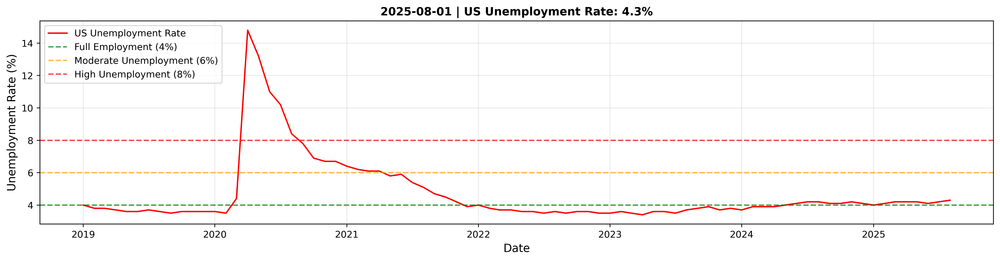

4277

In [18]:
df_unemployment = get_fred_series("UNRATE", FRED_API_KEY)

plt.figure(figsize=(15, 4), dpi=400)
plt.plot(df_unemployment[START_DATE:].index, df_unemployment[START_DATE:]["value"],
         label='US Unemployment Rate', linewidth=1.5, color='red')
plt.axhline(y=4.0, color='green', linestyle='--',
            alpha=0.7, label='Full Employment (4%)')
plt.axhline(y=6.0, color='orange', linestyle='--',
            alpha=0.7, label='Moderate Unemployment (6%)')
plt.axhline(y=8.0, color='red', linestyle='--',
            alpha=0.7, label='High Unemployment (8%)')
plt.title(f'{df_unemployment.index[-1].strftime("%Y-%m-%d")} | US Unemployment Rate: {df_unemployment.iloc[-1]["value"]:.1f}%',
          fontweight='bold')
plt.xlabel('Date', fontsize=12)
plt.ylabel('Unemployment Rate (%)', fontsize=12)
plt.legend(loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

gc.collect()


## Labor Force Participation Rate


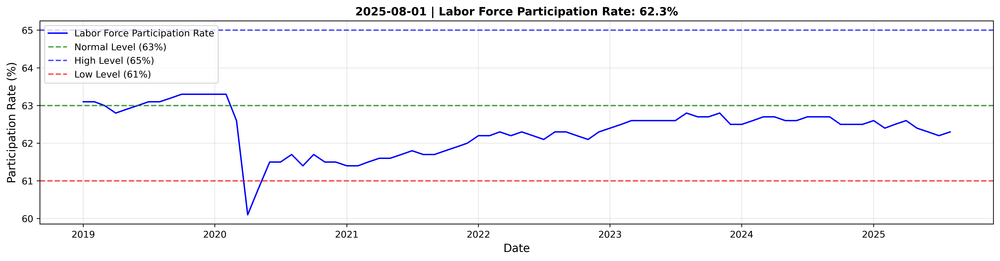

4277

In [19]:
df_lfpr = get_fred_series("CIVPART", FRED_API_KEY)

plt.figure(figsize=(15, 4), dpi=400)
plt.plot(df_lfpr[START_DATE:].index, df_lfpr[START_DATE:]["value"],
         label='Labor Force Participation Rate', linewidth=1.5, color='blue')
plt.axhline(y=63.0, color='green', linestyle='--',
            alpha=0.7, label='Normal Level (63%)')
plt.axhline(y=65.0, color='blue', linestyle='--',
            alpha=0.7, label='High Level (65%)')
plt.axhline(y=61.0, color='red', linestyle='--',
            alpha=0.7, label='Low Level (61%)')
plt.title(
    f'{df_lfpr.index[-1].strftime("%Y-%m-%d")} | Labor Force Participation Rate: {df_lfpr.iloc[-1]["value"]:.1f}%', fontweight='bold')
plt.xlabel('Date', fontsize=12)
plt.ylabel('Participation Rate (%)', fontsize=12)
plt.legend(loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

gc.collect()


# INDIVIDUAL INDICATORS

## Household Debt as a Percentage of GDP

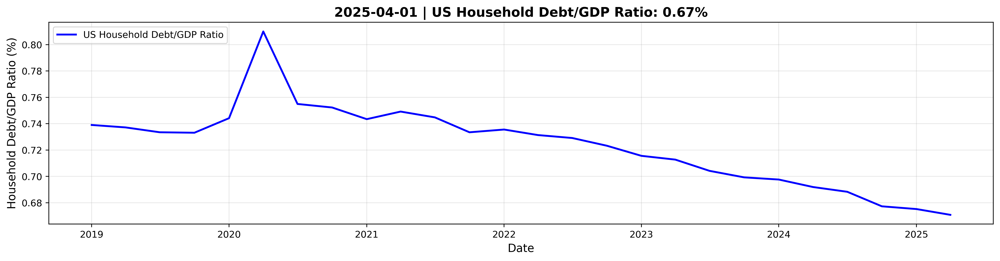

3846

In [20]:
df_us_debt = get_fred_series("CMDEBT", FRED_API_KEY)
df_us_gdp = get_fred_series("GDP", FRED_API_KEY)
df_us_combined = df_us_debt[START_DATE:]['value'] / \
    df_us_gdp[START_DATE:]['value']

plt.figure(figsize=(15, 4), dpi=400)
if 'df_us_combined' in locals():
    plt.plot(df_us_combined.index, df_us_combined,
             label='US Household Debt/GDP Ratio', linewidth=2, color='blue')
plt.title(
    f'{df_us_combined.index[-1].strftime("%Y-%m-%d")} | US Household Debt/GDP Ratio: {df_us_combined.iloc[-1]:.2f}%', fontsize=14, fontweight='bold')
plt.xlabel('Date', fontsize=12)
plt.ylabel('Household Debt/GDP Ratio (%)', fontsize=12)
plt.legend(loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

gc.collect()


## Core PCE (Personal Consumption Expenditures) Price Index

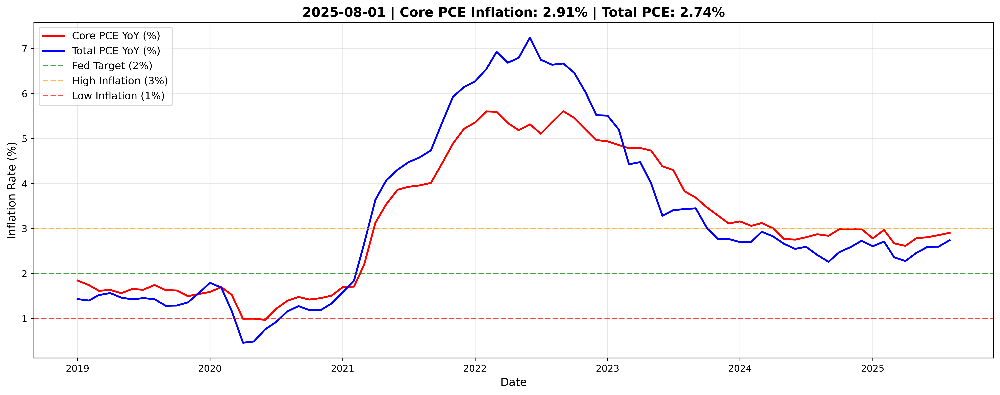

4471

In [21]:
df_core_pce = get_fred_series("PCEPILFE", FRED_API_KEY)
df_pce = get_fred_series("PCEPI", FRED_API_KEY)
core_pce_yoy = df_core_pce['value'].pct_change(periods=12) * 100
pce_yoy = df_pce['value'].pct_change(periods=12) * 100

plt.figure(figsize=(15, 6), dpi=400)
plt.plot(core_pce_yoy[START_DATE:].index, core_pce_yoy[START_DATE:],
         label='Core PCE YoY (%)', linewidth=2, color='red')
plt.plot(pce_yoy[START_DATE:].index, pce_yoy[START_DATE:],
         label='Total PCE YoY (%)', linewidth=2, color='blue')

plt.axhline(y=2.0, color='green', linestyle='--',
            alpha=0.7, label='Fed Target (2%)')
plt.axhline(y=3.0, color='orange', linestyle='--',
            alpha=0.7, label='High Inflation (3%)')
plt.axhline(y=1.0, color='red', linestyle='--',
            alpha=0.7, label='Low Inflation (1%)')
plt.title(f'{core_pce_yoy.index[-1].strftime("%Y-%m-%d")} | Core PCE Inflation: {core_pce_yoy.iloc[-1]:.2f}% | Total PCE: {pce_yoy.iloc[-1]:.2f}%',
          fontsize=14, fontweight='bold')
plt.xlabel('Date', fontsize=12)
plt.ylabel('Inflation Rate (%)', fontsize=12)
plt.legend(loc='upper left', fontsize=11)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

gc.collect()


## Consumer Confidence Index

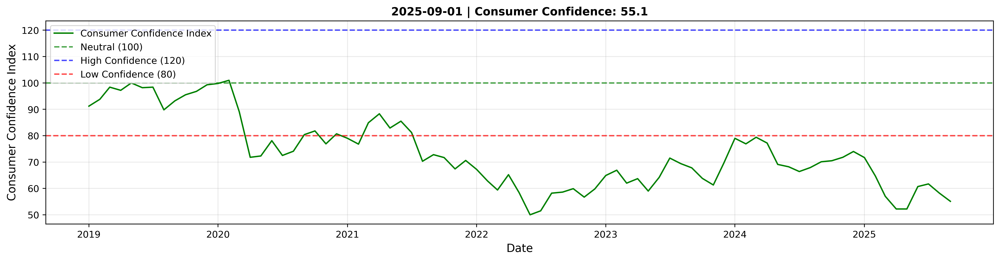

4496

In [22]:
df_consumer_confidence = get_fred_series("UMCSENT", FRED_API_KEY)

plt.figure(figsize=(15, 4), dpi=400)
plt.plot(df_consumer_confidence[START_DATE:].index, df_consumer_confidence[START_DATE:]["value"],
         label='Consumer Confidence Index', linewidth=1.5, color='green')
plt.axhline(y=100, color='green', linestyle='--',
            alpha=0.7, label='Neutral (100)')
plt.axhline(y=120, color='blue', linestyle='--',
            alpha=0.7, label='High Confidence (120)')
plt.axhline(y=80, color='red', linestyle='--',
            alpha=0.7, label='Low Confidence (80)')
plt.title(
    f'{df_consumer_confidence.index[-1].strftime("%Y-%m-%d")} | Consumer Confidence: {df_consumer_confidence.iloc[-1]["value"]:.1f}', fontweight='bold')
plt.xlabel('Date', fontsize=12)
plt.ylabel('Consumer Confidence Index', fontsize=12)
plt.legend(loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

gc.collect()


## Housing Starts

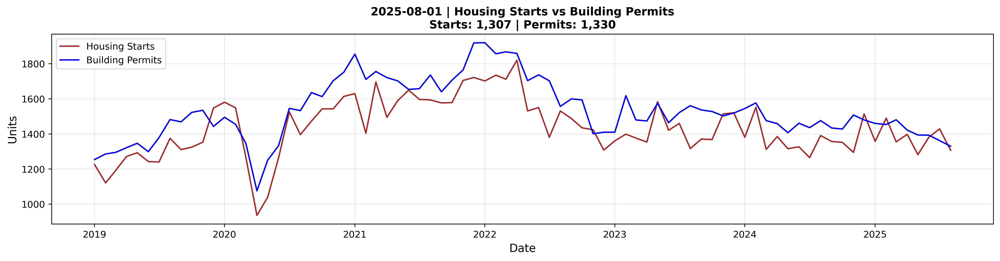

3797

In [23]:
df_housing_starts = get_fred_series("HOUST", FRED_API_KEY)
current_housing = df_housing_starts.iloc[-1]["value"]
df_building_permits = get_fred_series("PERMIT", FRED_API_KEY)
current_permits = df_building_permits.iloc[-1]["value"]

plt.figure(figsize=(15, 4), dpi=400)
plt.plot(df_housing_starts[START_DATE:].index, df_housing_starts[START_DATE:]["value"],
         label='Housing Starts', linewidth=1.5, color='brown')
plt.plot(df_building_permits[START_DATE:].index, df_building_permits[START_DATE:]["value"],
         label='Building Permits', linewidth=1.5, color='blue')
plt.title(f'{df_housing_starts.index[-1].strftime("%Y-%m-%d")} | Housing Starts vs Building Permits\n'
          f'Starts: {current_housing:,.0f} | Permits: {current_permits:,.0f}',
          fontweight='bold')
plt.xlabel('Date', fontsize=12)
plt.ylabel('Units', fontsize=12)
plt.legend(loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

gc.collect()


## Mortgage Delinquency Rate

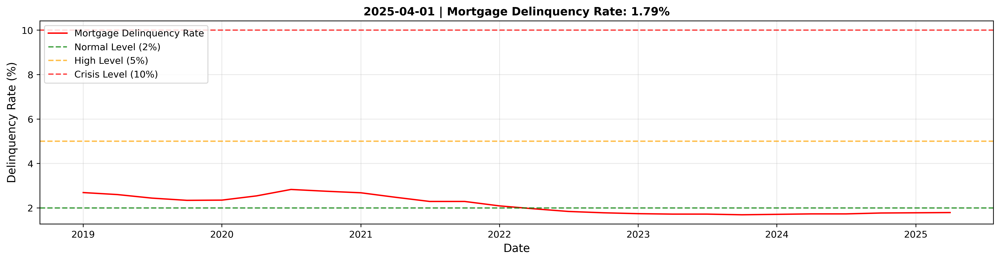

4105

In [24]:
df_mortgage_delinq = get_fred_series("DRSFRMACBS", FRED_API_KEY)

plt.figure(figsize=(15, 4), dpi=400)
plt.plot(df_mortgage_delinq[START_DATE:].index, df_mortgage_delinq[START_DATE:]["value"],
         label='Mortgage Delinquency Rate', linewidth=1.5, color='red')
plt.axhline(y=2.0, color='green', linestyle='--',
            alpha=0.7, label='Normal Level (2%)')
plt.axhline(y=5.0, color='orange', linestyle='--',
            alpha=0.7, label='High Level (5%)')
plt.axhline(y=10.0, color='red', linestyle='--',
            alpha=0.7, label='Crisis Level (10%)')
plt.title(f'{df_mortgage_delinq.index[-1].strftime("%Y-%m-%d")} | Mortgage Delinquency Rate: {df_mortgage_delinq.iloc[-1]["value"]:.2f}%', fontweight='bold')
plt.xlabel('Date', fontsize=12)
plt.ylabel('Delinquency Rate (%)', fontsize=12)
plt.legend(loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

gc.collect()


# INDUSTRIAL INDICATORS

## Corporate Debt Growth Rate

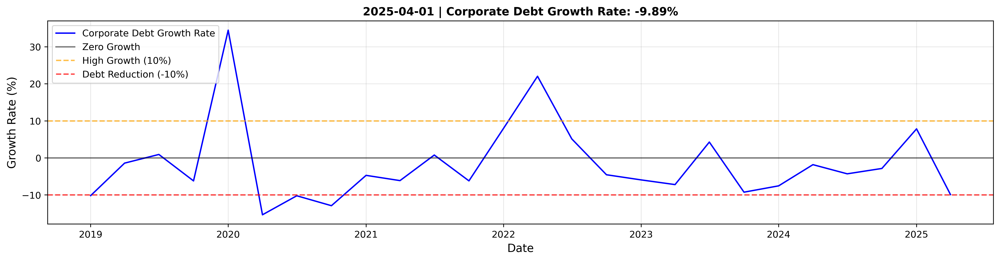

4185

In [25]:
df_corporate_debt = get_fred_series("NCBCMDPMVCE", FRED_API_KEY)
df_corporate_debt_growth = df_corporate_debt['value'].dropna(
).pct_change() * 100

plt.figure(figsize=(15, 4), dpi=400)
plt.plot(df_corporate_debt_growth[START_DATE:].index, df_corporate_debt_growth[START_DATE:],
         label='Corporate Debt Growth Rate', linewidth=1.5, color='blue')
plt.axhline(y=0, color='black', linestyle='-', alpha=0.5, label='Zero Growth')
plt.axhline(y=10, color='orange', linestyle='--',
            alpha=0.7, label='High Growth (10%)')
plt.axhline(y=-10, color='red', linestyle='--',
            alpha=0.7, label='Debt Reduction (-10%)')
plt.title(
    f'{df_corporate_debt_growth.index[-1].strftime("%Y-%m-%d")} | Corporate Debt Growth Rate: {df_corporate_debt_growth.iloc[-1]:.2f}%', fontweight='bold')
plt.xlabel('Date', fontsize=12)
plt.ylabel('Growth Rate (%)', fontsize=12)
plt.legend(loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

gc.collect()


## Capacity Utilization

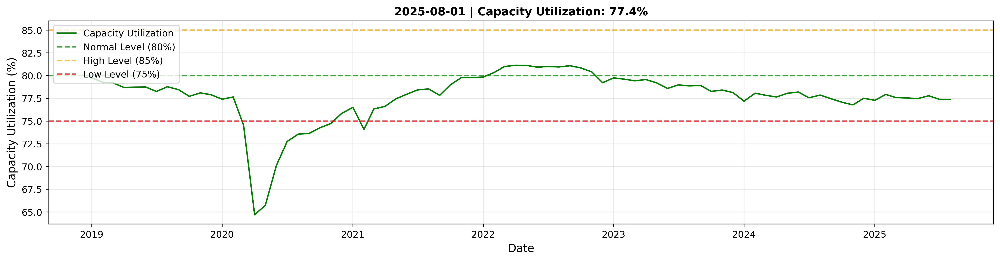

4580

In [26]:
df_capacity = get_fred_series("TCU", FRED_API_KEY)

plt.figure(figsize=(15, 4), dpi=400)
plt.plot(df_capacity[START_DATE:].index, df_capacity[START_DATE:]["value"],
         label='Capacity Utilization', linewidth=1.5, color='green')
plt.axhline(y=80, color='green', linestyle='--',
            alpha=0.7, label='Normal Level (80%)')
plt.axhline(y=85, color='orange', linestyle='--',
            alpha=0.7, label='High Level (85%)')
plt.axhline(y=75, color='red', linestyle='--',
            alpha=0.7, label='Low Level (75%)')
plt.title(f'{df_capacity.index[-1].strftime("%Y-%m-%d")} | Capacity Utilization: {df_capacity.iloc[-1]["value"]:.1f}%', fontweight='bold')
plt.xlabel('Date', fontsize=12)
plt.ylabel('Capacity Utilization (%)', fontsize=12)
plt.legend(loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

gc.collect()


##  Freight Index

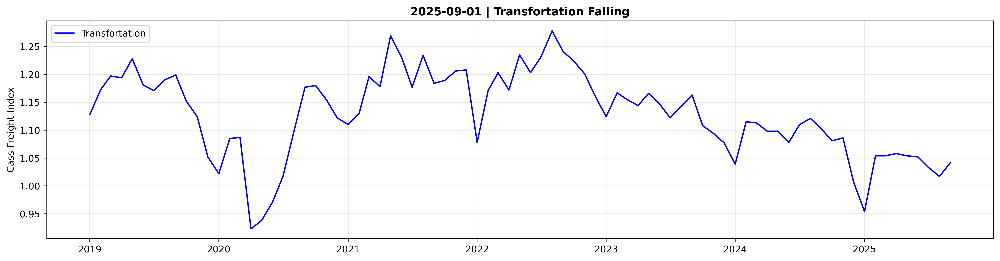

3826

In [27]:
df_cass = get_fred_series("FRGSHPUSM649NCIS", FRED_API_KEY)

plt.figure(figsize=(15, 4), dpi=400)
plt.plot(df_cass[START_DATE:].index, df_cass[START_DATE:]['value'],
         label='Transfortation', linewidth=1.5, color='blue')
if df_cass.iloc[-1, 0] > df_cass.iloc[-2, 0]:
    plt.title(
        f'{df_cass.index[-1].strftime("%Y-%m-%d")} | Transfortation Rising', fontweight='bold')
else:
    plt.title(
        f'{df_cass.index[-1].strftime("%Y-%m-%d")} | Transfortation Falling', fontweight='bold')
plt.ylabel('Cass Freight Index')
plt.legend(loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

gc.collect()


## Industrial Production

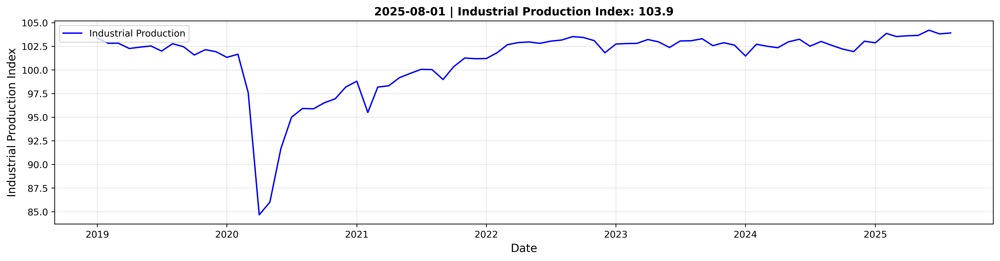

4043

In [28]:
df_industrial = get_fred_series("INDPRO", FRED_API_KEY)

plt.figure(figsize=(15, 4), dpi=400)
plt.plot(df_industrial[START_DATE:].index, df_industrial[START_DATE:]["value"],
         label='Industrial Production', linewidth=1.5, color='blue')
plt.title(f'{df_industrial.index[-1].strftime("%Y-%m-%d")} | Industrial Production Index: {df_industrial.iloc[-1]["value"]:.1f}', fontweight='bold')
plt.xlabel('Date', fontsize=12)
plt.ylabel('Industrial Production Index', fontsize=12)
plt.legend(loc='upper left')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

gc.collect()


## FRED 시리즈 최신 데이터 확인

In [29]:
# 노트북에서 사용하는 모든 FRED 시리즈 ID 목록
fred_series_list = {
    "DGS10": "10-Year Treasury Rate",
    "DGS2": "2-Year Treasury Rate",
    "SOFR": "SOFR (Secured Overnight Financing Rate)",
    "IORB": "Interest on Reserve Balances",
    "FEDFUNDS": "Federal Funds Rate",
    "DFII10": "10-Year TIPS Rate",
    "INTGSBGBM193N": "UK Interest Rate",
    "ECBMRRFR": "EU ECB Main Rate",
    "IR3TIB01JPM156N": "Japan Interest Rate",
    "INTGSBKRM193N": "Korea Interest Rate",
    "VIXCLS": "VIX Index",
    "STLFSI4": "Stress Index",
    "ICSA": "Initial Unemployment Claims",
    "CCSA": "Continued Unemployment Claims",
    "UNRATE": "Unemployment Rate",
    "CIVPART": "Labor Force Participation Rate",
    "CMDEBT": "Household Debt",
    "GDP": "GDP",
    "PCEPILFE": "Core PCE",
    "PCEPI": "PCE Price Index",
    "UMCSENT": "Consumer Confidence Index",
    "HOUST": "Housing Starts",
    "PERMIT": "Building Permits",
    "DRSFRMACBS": "Mortgage Delinquency Rate",
    "NCBCMDPMVCE": "Corporate Debt",
    "TCU": "Capacity Utilization",
    "FRGSHPUSM649NCIS": "Freight Index",
    "INDPRO": "Industrial Production",
    "CPATAX": "Corporate Profits After Tax",
    "BAMLH0A0HYM2": "High Yield Bond Spread",
    "NEWORDER": "New Orders"
}

# 각 시리즈의 최신 데이터 날짜 확인
results = []
april_2024 = pd.to_datetime("2025-10-01")
today = pd.to_datetime(datetime.now())

print("=" * 80)
print("FRED 시리즈 최신 데이터 확인")
print("=" * 80)
print(f"확인 기준일: {today.strftime('%Y-%m-%d')}")
print(f"4월 이후 업데이트 기준: {april_2024.strftime('%Y-%m-%d')} 이후")
print("=" * 80)
print()

for series_id, description in fred_series_list.items():
    latest_date, success = get_fred_series_info(series_id, FRED_API_KEY)
    if success and latest_date:
        days_since_update = (today - latest_date).days
        is_updated_after_april = latest_date >= april_2024
        status = "✓ 업데이트됨" if is_updated_after_april else "✗ 업데이트 안됨"
        
        results.append({
            "Series ID": series_id,
            "Description": description,
            "Latest Date": latest_date.strftime("%Y-%m-%d"),
            "Days Since Update": days_since_update,
            "Updated After April": is_updated_after_april,
            "Status": status
        })
        
        print(f"{series_id:20s} | {description:40s} | 최신: {latest_date.strftime('%Y-%m-%d')} ({days_since_update:3d}일 전) | {status}")
    else:
        results.append({
            "Series ID": series_id,
            "Description": description,
            "Latest Date": "ERROR",
            "Days Since Update": None,
            "Updated After April": False,
            "Status": "✗ 데이터 없음"
        })
        print(f"{series_id:20s} | {description:40s} | 최신: ERROR | ✗ 데이터 없음")

print()
print("=" * 80)

# 4월 이후 업데이트 안 된 항목들만 필터링
df_results = pd.DataFrame(results)
not_updated = df_results[df_results["Updated After April"] == False]

print()
print(f"4월 이후 업데이트 안 된 항목: {len(not_updated)}개")
print("=" * 80)
if len(not_updated) > 0:
    for idx, row in not_updated.iterrows():
        print(f"{row['Series ID']:20s} | {row['Description']:40s} | 최신: {row['Latest Date']} ({row['Days Since Update']}일 전)")
else:
    print("모든 시리즈가 4월 이후 업데이트되었습니다.")

gc.collect()


FRED 시리즈 최신 데이터 확인
확인 기준일: 2025-11-07
4월 이후 업데이트 기준: 2025-10-01 이후

DGS10                | 10-Year Treasury Rate                    | 최신: 2025-11-05 (  2일 전) | ✓ 업데이트됨
DGS2                 | 2-Year Treasury Rate                     | 최신: 2025-11-05 (  2일 전) | ✓ 업데이트됨
SOFR                 | SOFR (Secured Overnight Financing Rate)  | 최신: 2025-11-05 (  2일 전) | ✓ 업데이트됨
IORB                 | Interest on Reserve Balances             | 최신: 2025-11-07 (  0일 전) | ✓ 업데이트됨
FEDFUNDS             | Federal Funds Rate                       | 최신: 2025-10-01 ( 37일 전) | ✓ 업데이트됨
DFII10               | 10-Year TIPS Rate                        | 최신: 2025-11-05 (  2일 전) | ✓ 업데이트됨
INTGSBGBM193N        | UK Interest Rate                         | 최신: 2025-06-01 (159일 전) | ✗ 업데이트 안됨
ECBMRRFR             | EU ECB Main Rate                         | 최신: 2025-11-06 (  1일 전) | ✓ 업데이트됨
IR3TIB01JPM156N      | Japan Interest Rate                      | 최신: 2025-09-01 ( 67일 전) | ✗ 업데이트 안됨
INTGSBKRM193N        | Korea

0